# New CVID data

All samples (batch 1 + batch 2)

Excluding twin data and BCR activation

10.02.2021

(Preprocessing happened in notebook M1)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do SCTransfor instead of normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes
- subset to HVGs
- (skipping scaling, not necessary because we've done SCTransform)
- pca (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logreg model and add annotation (before it used to be earlier in the workflow)**
- neighbors/bbknn - deciding on which batch correction we will be using
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.4 scipy==1.3.2 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


A Benjamini-Hochberg function for later. Running FDR is surprisingly inconvenient using built-in Python options.

In [4]:
def bh(pvalues):
    '''
    Computes the Benjamini-Hochberg FDR correction.
    
    Input:
        * pvals - vector of p-values to correct
    '''
    n = int(pvalues.shape[0])
    new_pvalues = np.empty(n)
    values = [ (pvalue, i) for i, pvalue in enumerate(pvalues) ]
    values.sort()
    values.reverse()
    new_values = []
    for i, vals in enumerate(values):
        rank = n - i
        pvalue, index = vals
        new_values.append((n/rank) * pvalue)
    for i in range(0, int(n)-1):
        if new_values[i] < new_values[i+1]:
            new_values[i+1] = new_values[i]
    for i, vals in enumerate(values):
        pvalue, index = vals
        new_pvalues[index] = new_values[i]
    return new_pvalues

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

## Reding the preprocessed object

Preprocessing happened in M0 notebook

In [6]:
# reading
adata = sc.read(save_path+'adata_raw_filtered_validation_cohort.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 112463 × 21749 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

In [8]:
adata.var['feature_types-0'].value_counts()

Gene Expression     17254
nan                  4303
Antibody Capture      192
Name: feature_types-0, dtype: int64

# Subsetting to only GEX data

In [9]:
adata = adata[:, adata.var['feature_types-0'] != 'Antibody Capture'].copy()
adata

AnnData object with n_obs × n_vars = 112463 × 21557 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

_________________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [10]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving the raw attribute
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:13): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


_____________________________________________________________________________________________________________________________________________________________

### Filter Cell cycle genes 
Per genes analysis: identify genes behaving like known cell cycle genes

There are no cycle genes, so skipping this here

extracting highly variable genes
    finished (0:00:13)


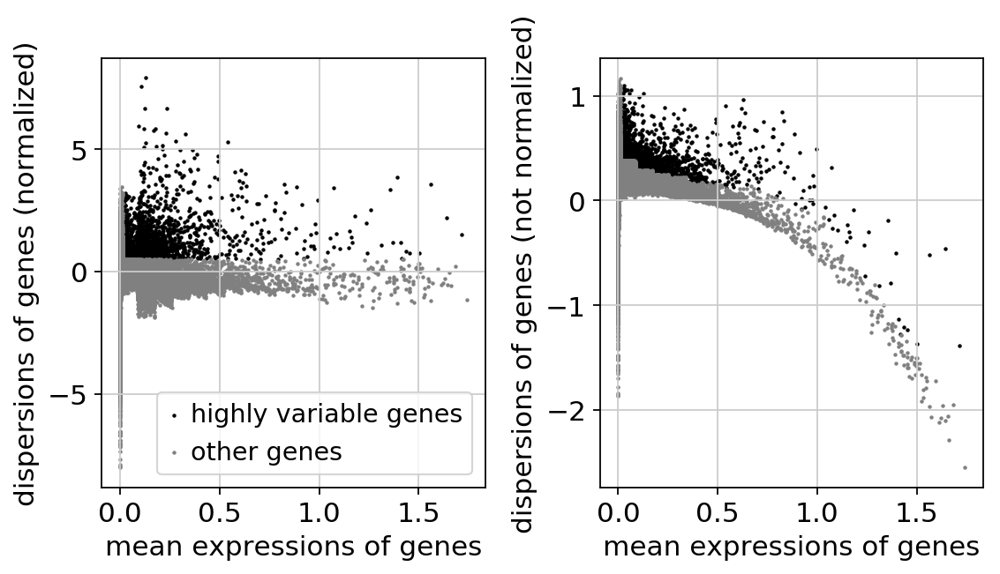

In [11]:
cellcycle_adata = adata.copy()
# Extract highly variable genes
filter_result = sc.pp.filter_genes_dispersion(
    cellcycle_adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result,save='_ccg_identification.pdf')

In [12]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T
cellcycle_adata = cellcycle_adata[filter_result.gene_subset,:]


In [13]:
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(cellcycle_adata)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
    finished (0:00:05)


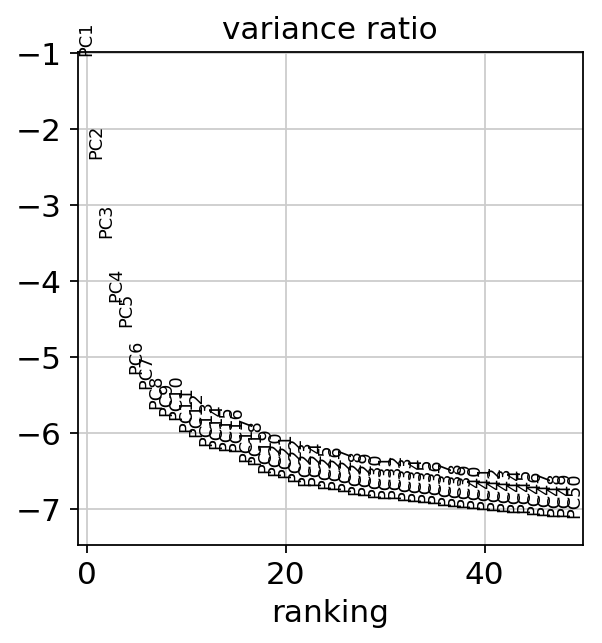

In [14]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, n_pcs=50,
                         save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 8
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


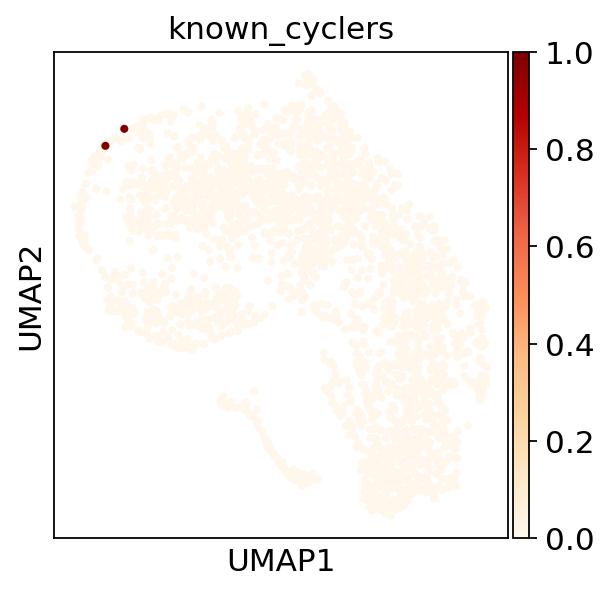

In [15]:
# Identify genes behaving like cc genes
num_pcs = 8
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


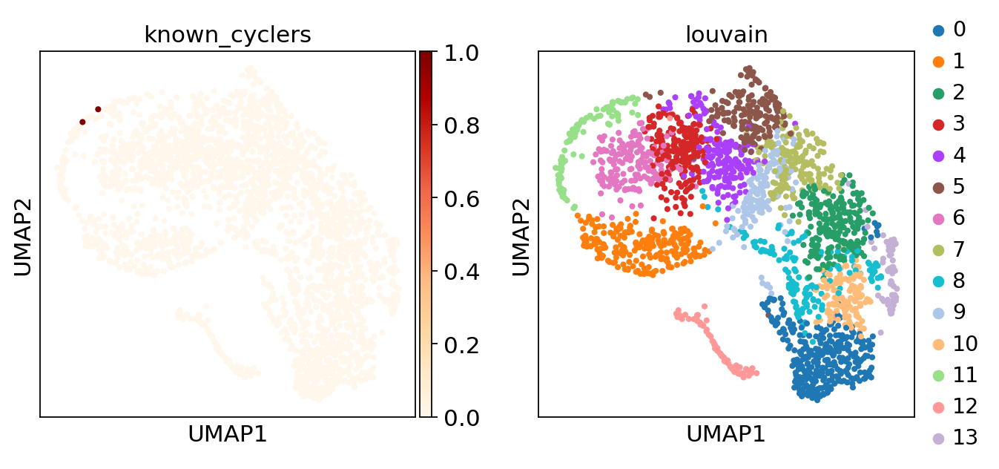

In [16]:
# Cluster GENES into subgroups using louvain
sc.tl.louvain(cellcycle_adata, resolution=1.0)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers',
                                  'louvain'],color_map='OrRd',save='_ccg_identification.pdf')

In [17]:
# Locate genes of interests' cluster
print(cellcycle_adata.obs.loc[['CDK1','MKI67','CCNB2','PCNA'],'louvain'])


index
CDK1     NaN
MKI67     11
CCNB2    NaN
PCNA      11
Name: louvain, dtype: category
Categories (14, object): [0, 1, 2, 3, ..., 10, 11, 12, 13]


/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:961: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [18]:
adata

AnnData object with n_obs × n_vars = 112463 × 21557 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

Se removing genes from cluster 11 here

In [19]:
# Add unstructured dict-like annotation for ccgs
adata.uns['ccgs'] = list(cellcycle_adata.obs[(cellcycle_adata.obs['louvain']=='11')].index)
# Remove cc genes
adata = adata[:,[i not in adata.uns['ccgs'] for i in adata.var_names]]


In [20]:
adata

View of AnnData object with n_obs × n_vars = 112463 × 21466 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'ccgs'

In [25]:
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'


Trying to set attribute `.obs` of view, making a copy.


    finished: added
    'S_score', score of gene set (adata.obs) (0:00:45)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs) (0:00:39)
-->     'phase', cell cycle phase (adata.obs)


In [26]:
adata

AnnData object with n_obs × n_vars = 112463 × 21466 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'ccgs'

_______________________________________________________________________________________________________

# Subsetting to HVGs & scaling

In [27]:
%%time
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 5.87 s, sys: 1.36 s, total: 7.22 s
Wall time: 7.24 s


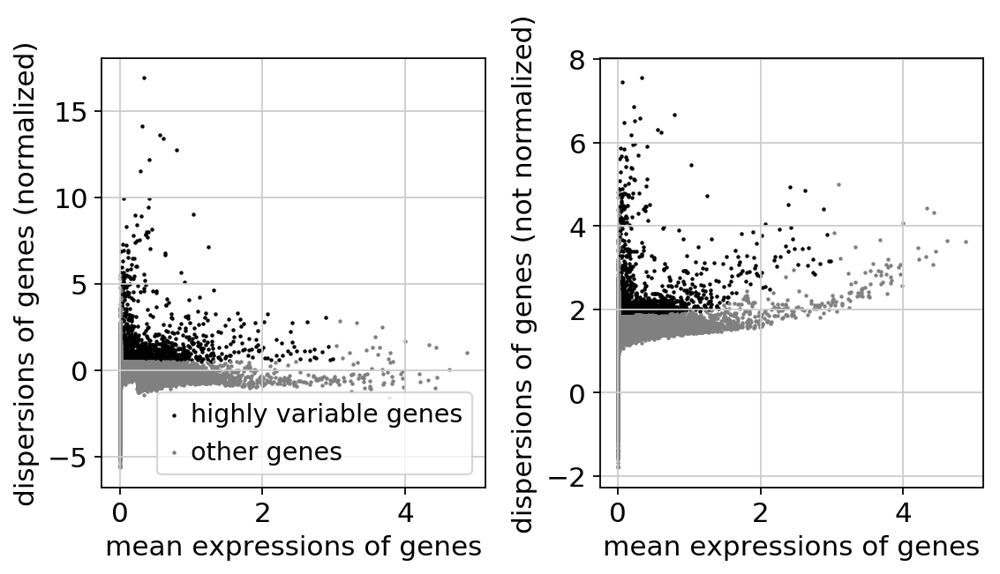

CPU times: user 1.46 s, sys: 704 ms, total: 2.16 s
Wall time: 1.13 s


In [28]:
%%time
sc.pl.highly_variable_genes(adata)

In [29]:
adata_hvg = adata[:, adata.var['highly_variable']]

In [30]:
adata_hvg

View of AnnData object with n_obs × n_vars = 112463 × 2757 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ccgs'

In [31]:
%%time
sc.pp.scale(adata_hvg, max_value=10)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


CPU times: user 1.9 s, sys: 1.54 s, total: 3.44 s
Wall time: 3.43 s


________

### PCA

In [32]:
%%time
sc.tl.pca(adata_hvg, svd_solver='arpack', n_comps=50)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:33)
CPU times: user 3min, sys: 2min 49s, total: 5min 49s
Wall time: 33.3 s


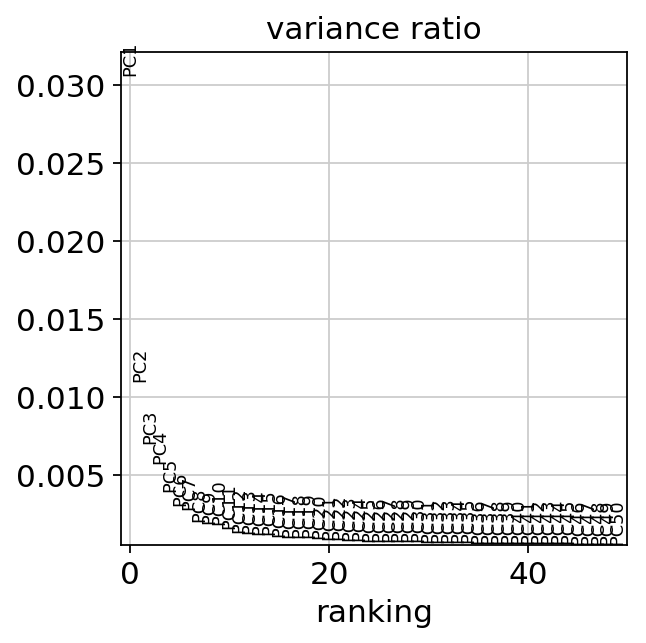

In [33]:
sc.pl.pca_variance_ratio(adata_hvg, n_pcs=50)

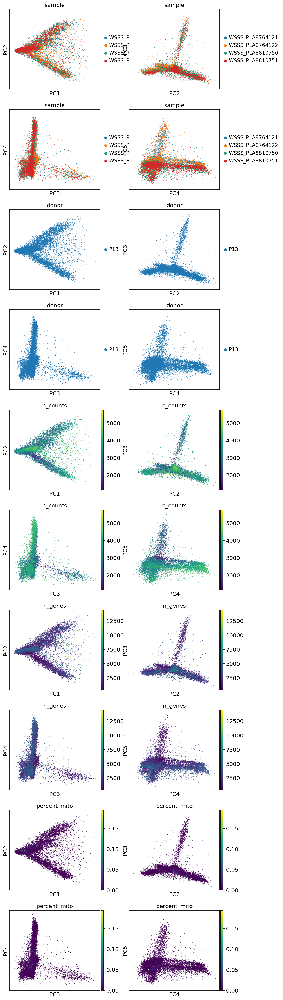

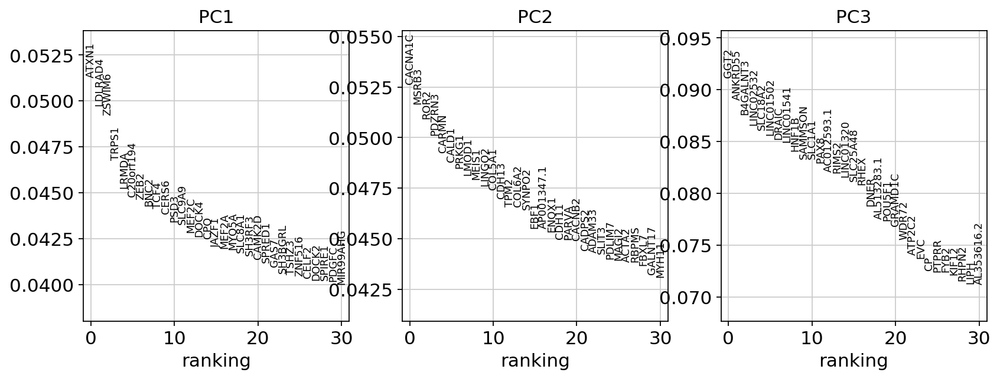

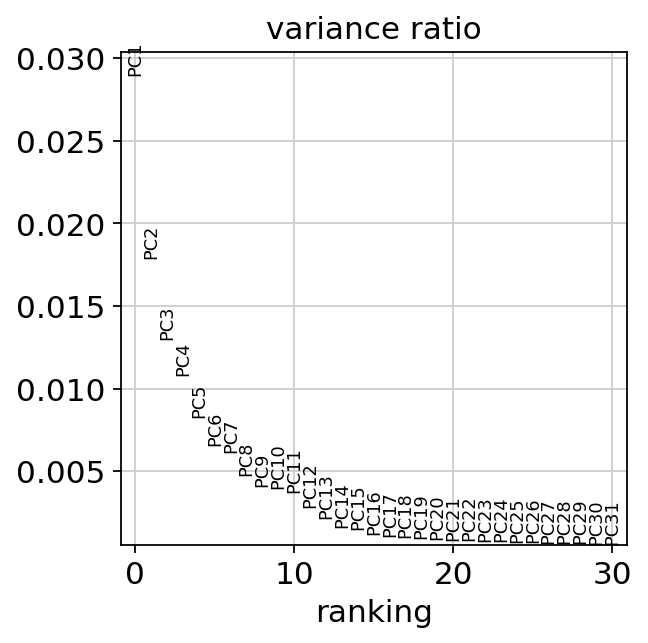

In [58]:
sc.pl.pca_overview(adata_hvg, color = ['sample', 'donor', 'n_counts', 'n_genes', 
                                    'percent_mito'], components = ['1,2', '2,3', '3,4', '4,5'], ncols = 2)

__________________________________________________________________________________________________________________________________________________________________

### Neighbourhood graph & UMAP

In [34]:
%%time
sc.pp.neighbors(adata_hvg, n_neighbors=10, n_pcs=12)

computing neighbors
    using 'X_pca' with n_pcs = 12


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/opt/conda/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/uma

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:19)
CPU times: user 19 s, sys: 204 ms, total: 19.2 s
Wall time: 19.2 s


__________________________________________________________________________________________________________________________________________________________________

In [35]:
%%time
sc.tl.umap(adata_hvg, random_state=0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:42)
CPU times: user 2min 42s, sys: 1min 2s, total: 3min 45s
Wall time: 1min 42s


# Plotting

In [36]:
adata_hvg

AnnData object with n_obs × n_vars = 112463 × 2757 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ccgs', 'pca', 'neighbors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

### No batch correction

12 PCs

... storing 'phase' as categorical


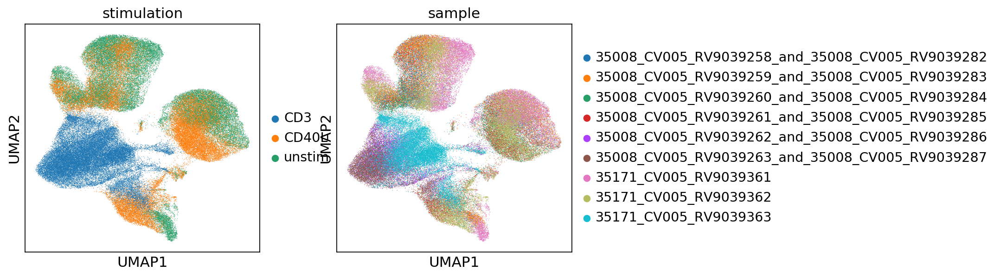

In [37]:
sc.pl.umap(adata_hvg, color=['stimulation','sample'])

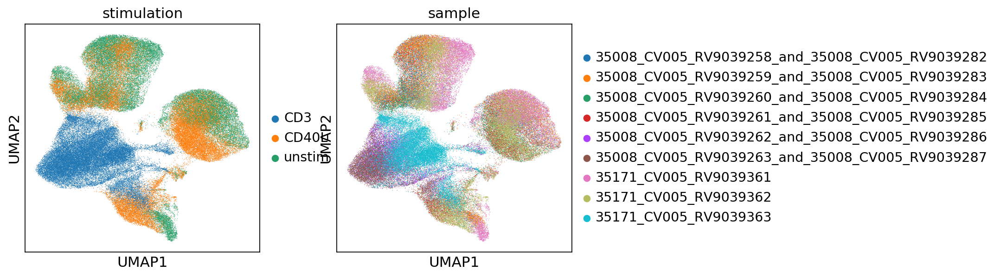

In [38]:
sc.pl.umap(adata_hvg, color=['stimulation','sample'])

In [39]:
for gene in list(adata_hvg.raw.var.index):
    if 'CD19' in gene:
        print(gene)

CD19


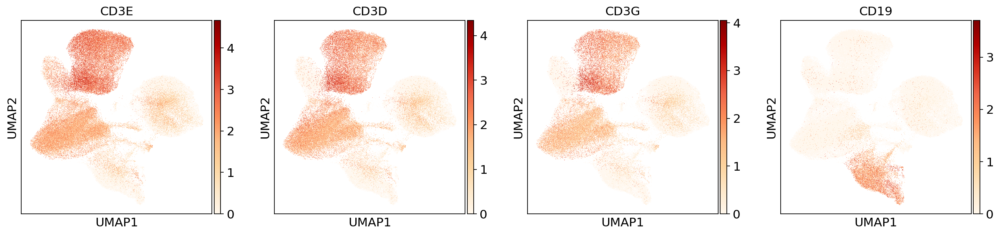

In [40]:
# TCR genes and CD19 - B cells
sc.pl.umap(adata_hvg, color=['CD3E','CD3D','CD3G','CD19'],
          cmap='OrRd', use_raw=True)

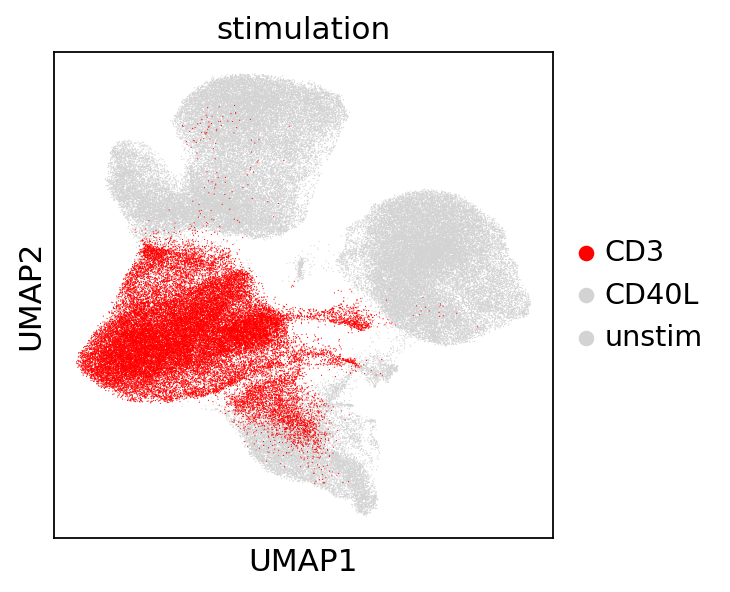

In [41]:
sc.pl.umap(adata_hvg, color=['stimulation'], palette = ['red','lightgrey','lightgrey','lightgrey'])

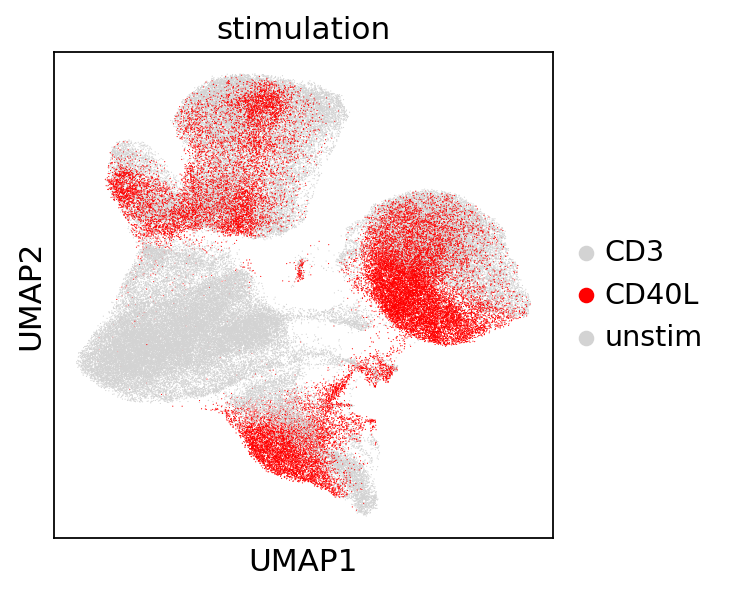

In [42]:
sc.pl.umap(adata_hvg, color=['stimulation'], palette = ['lightgrey','red','lightgrey','lightgrey'])

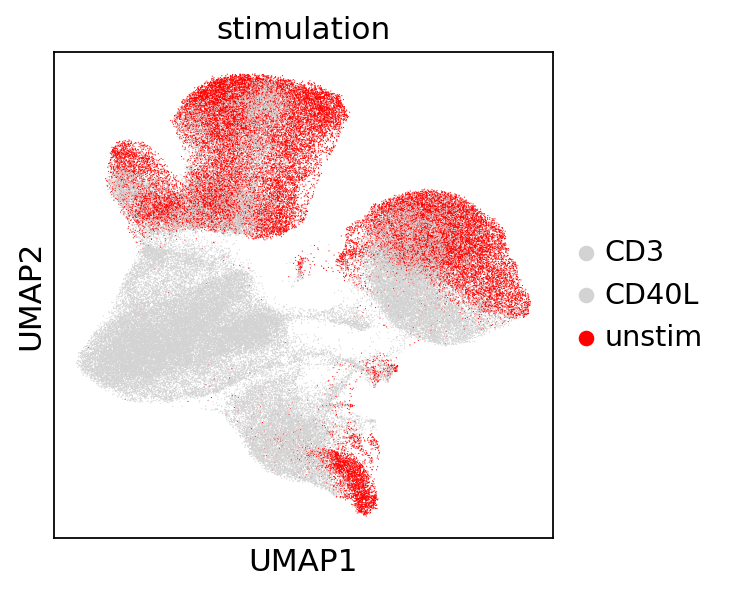

In [43]:
sc.pl.umap(adata_hvg, color=['stimulation'], palette = ['lightgrey','lightgrey','red','lightgrey'])

In [45]:
adata_hvg

AnnData object with n_obs × n_vars = 112463 × 2757 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ccgs', 'pca', 'neighbors', 'stimulation_colors', 'sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

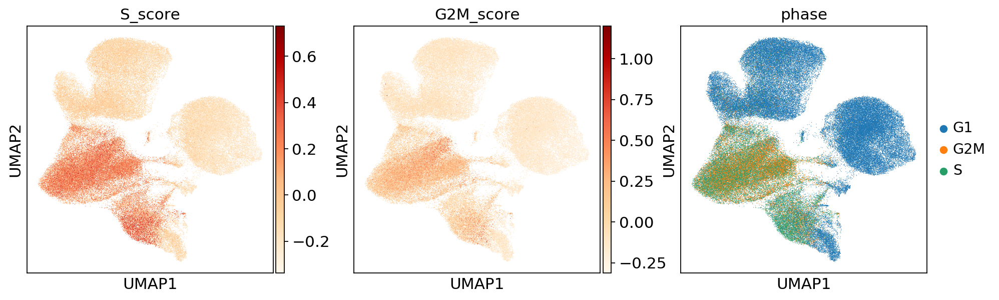

In [46]:
sc.pl.umap(adata_hvg, color=['S_score','G2M_score','phase'], cmap='OrRd')

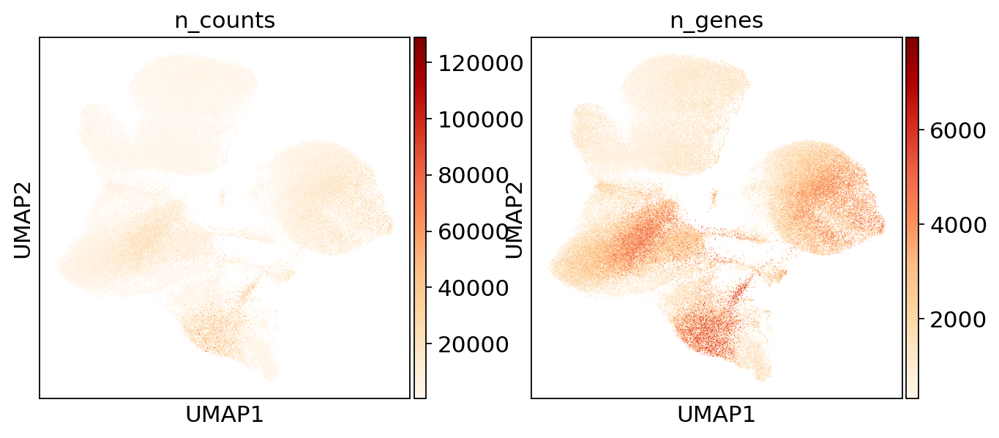

In [47]:
sc.pl.umap(adata_hvg, color=['n_counts',
                             'n_genes'], cmap='OrRd')

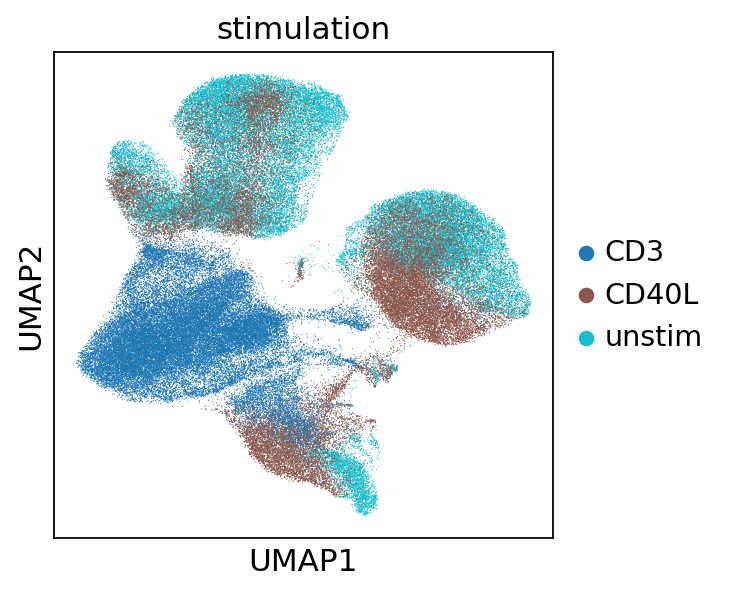

In [48]:
sc.pl.umap(adata_hvg, color=['stimulation'], palette='tab10')

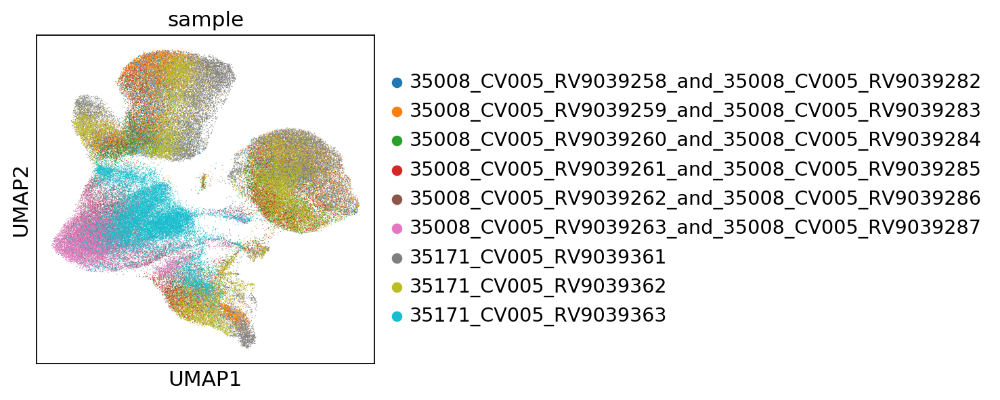

In [49]:
sc.pl.umap(adata_hvg, color=['sample'], palette='tab10')

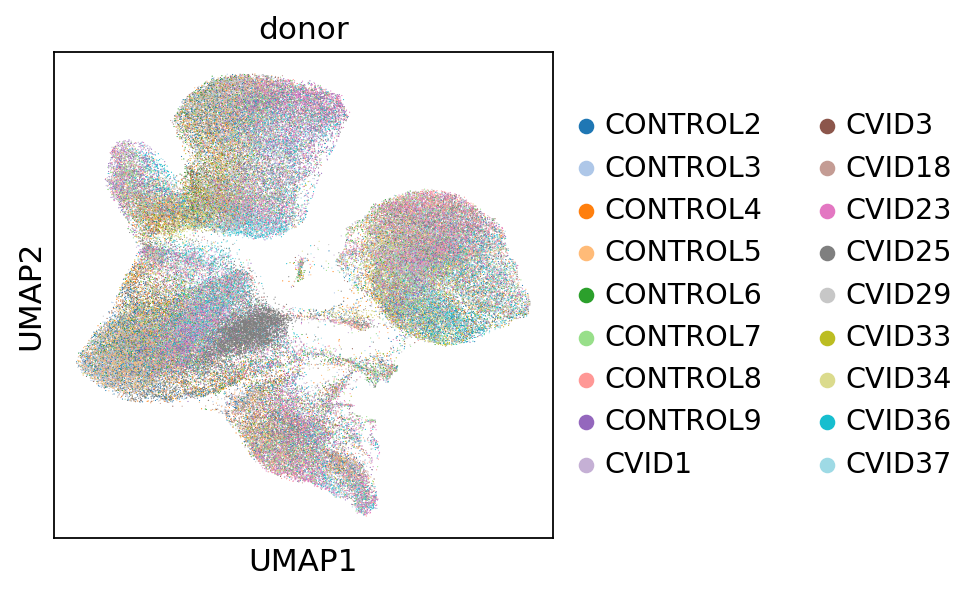

In [58]:
sc.pl.umap(adata_hvg, color=['donor'], palette='tab20')

# Preliminary louvain clustering and some DE

In [59]:
sc.tl.louvain(adata_hvg,
             resolution=1.0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:42)


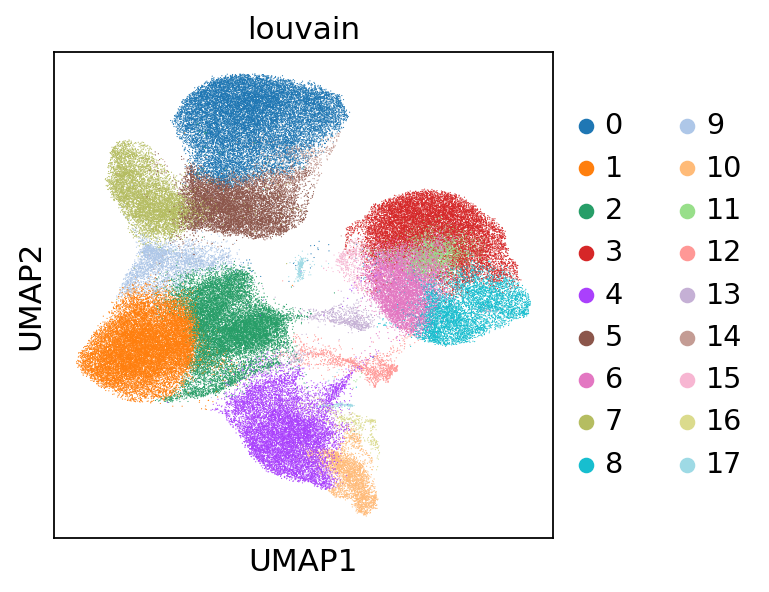

In [60]:
sc.pl.umap(adata_hvg, color='louvain')

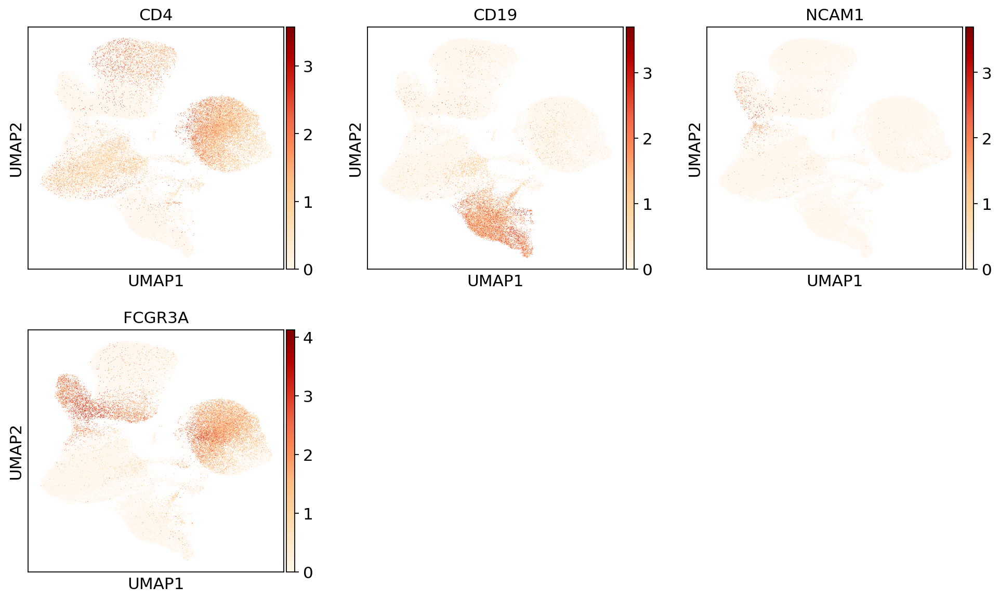

In [61]:
sc.pl.umap(adata_hvg, color=['CD4',#'CD8',
                             #'CD3', # T cells
                             'CD19', # B cells
                             # NK markers
                             'NCAM1', # CD56
                             'FCGR3A', # CD16
                            ], cmap='OrRd',
          ncols=3)

### Second step of Bertie doublet calling

In [62]:
adata_raw = sc.read(save_path + 'adata_raw_filtered_validation_cohort.h5ad')

In [63]:
# reading the full object to retrieve 'is_doublet' labels
adata = adata_raw.copy()

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:39)
         is_doublet
louvain            
0          0.004554
1          0.007172
2          0.022283
3          0.037516
4          0.058175
5          0.029801
6          0.090021
7          0.003101
8          0.141944
9          0.001648
10         0.042208
11         0.573121
12         0.137031
13         0.045556
14         0.134615
15         0.091503
16         0.005195
17         0.000000


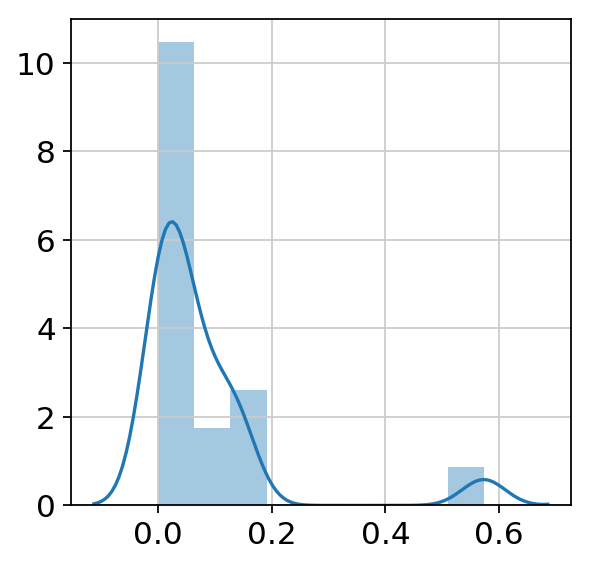

In [64]:
sc.tl.louvain(adata_hvg, random_state=0)
cluster_key = 'louvain'

doublet_counts = adata_hvg.obs.loc[:,['is_doublet', cluster_key]].groupby(cluster_key).mean()
#this can be printed for a summary of per-population doublet frequency...
print(doublet_counts)
#...or shown as a histogram for a potentially useful visualisation
sns.distplot(doublet_counts)

#the actual computation happens here
med = np.median(doublet_counts)
mask = doublet_counts.values>med
mad = np.median(doublet_counts.values[mask]-med)
pvals = 1-scipy.stats.norm.cdf(doublet_counts, loc=med, scale=1.4826*mad)
pvals_adj = bh(pvals)
doublet_populations = list(doublet_counts.index[pvals_adj<0.1])


In [65]:
# adding 'is_doublet' annotation by throsholding the bh_pvalue, this is not the end of doublet calling
# this parameter can be tweaked according to how harsh the detection needs to be
# the less it is, the less doublets it will call
adata.obs['is_doublet'] = adata.obs['bh_pval'] < 0.01


#flag the entirety of the doublet populations as doublets
adata_hvg.obs['is_doublet_propagate'] = adata.obs['is_doublet'].copy()
adata_hvg.obs.loc[[i in doublet_populations for i in adata_hvg.obs[cluster_key]],'is_doublet_propagate'] = True

## Looking at and removing the doublets

At this step it's best to look at both ```is_doublet``` annotation from the 1st step of bertie doublet calling and ```is_doublet_poptrim``` from this second step and decide which one to use - in our case it seems like the latter is a bit too harsh

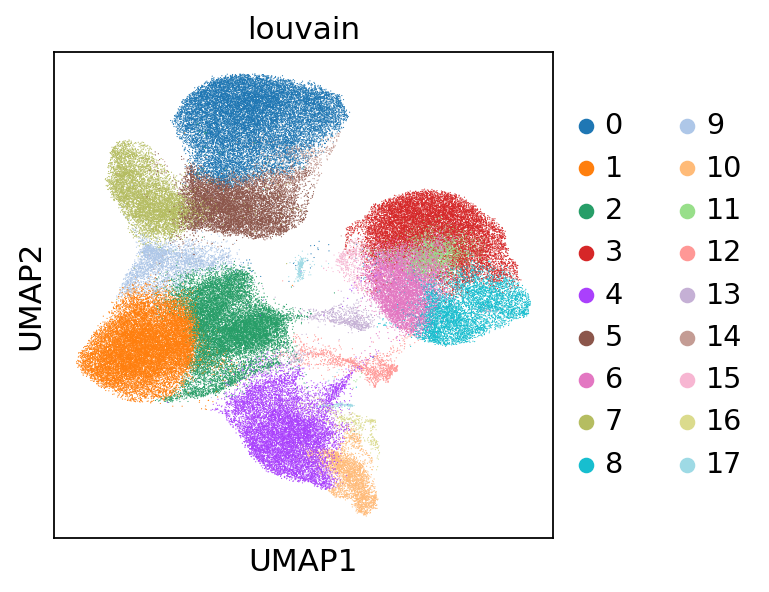

In [66]:
sc.pl.umap(adata_hvg, color=['louvain'])

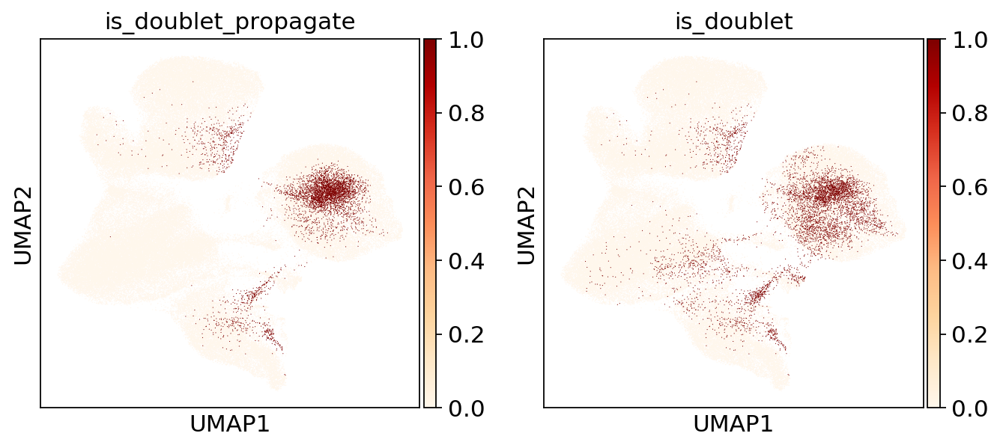

In [67]:
# bh_pval < 0.01
sc.pl.umap(adata_hvg, color=['is_doublet_propagate','is_doublet'], 
           ncols = 2, cmap='OrRd')

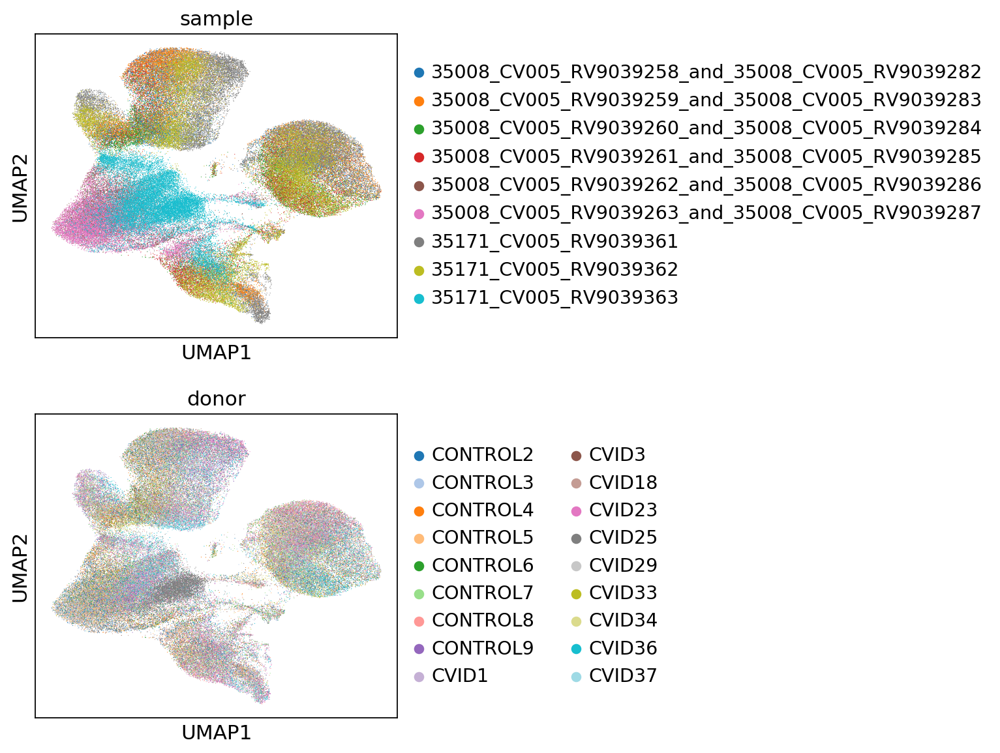

In [68]:
sc.pl.umap(adata_hvg, color=['sample','donor'], ncols=1, use_raw=True, cmap='OrRd')

In [69]:
np.unique(adata_hvg.obs['is_doublet'], return_counts=True)

(array([False,  True]), array([107050,   5413]))

In [70]:
# without souporcell doublets, donor labels, no batch correction, 12 PCs
adata_hvg.write(save_path+'adata_hvg_prelim_analysis_validation_cohort.h5ad')

In [7]:
adata_hvg = sc.read(save_path+'adata_hvg_prelim_analysis_validation_cohort.h5ad')

/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


In [71]:
adata_hvg_no_doublets = adata_hvg[adata_hvg.obs['is_doublet'] == False].copy()

In [72]:
adata_hvg_no_doublets

AnnData object with n_obs × n_vars = 107050 × 2757 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'louvain', 'is_doublet_propagate'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ccgs', 'pca', 'neighbors', 'stimulation_colors', 'sample_colors', 'phase_colors', '

In [73]:
# save this and reanalyse the object without doublets
pd.DataFrame(adata_hvg_no_doublets.obs.index).to_csv('cells_no_doublets_GEX_only_based_validation_cohort_20210210.csv')